# LAVIS Library Example

The script demonstrates how to generate captions and attention maps for an image from the LAVIS library.
Due to different architectures, you might have trouble running the script on your local machine. To prevent this, this script is supposed to be run on Google Colab. Here is a [beginner's guide](https://medium.com/lean-in-women-in-tech-india/google-colab-the-beginners-guide-5ad3b417dfa) to Google Colab.

Let's setup Google Drive and LAVIS first.

In [ ]:
# Mount Google Drive to access files
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Change working directory to MyDrive
%cd gdrive/MyDrive
# Clone LAVIS repository from Github
! git clone https://github.com/valeriatisch/LAVIS.git
# Change working directory to LAVIS
%cd LAVIS
# Install LAVIS requirements
! pip install .

In [ ]:
# Import necessary libraries
import torch
import shutil
import requests
import numpy as np
from PIL import Image
from pathlib import Path
from matplotlib import pyplot as plt

from lavis.common.gradcam import getAttMap
from lavis.models import load_model_and_preprocess
from lavis.models.blip_models.blip_image_text_matching import compute_gradcam

### Example 1: Image Captioning

Let's download an image and save it to Google Drive.

In [ ]:
# Download the image and save it
img_name = 'louvre_img.jpg'
img_url = 'https://upload.wikimedia.org/wikipedia/commons/8/8c/Cimabue_-_Maest%C3%A0_du_Louvre.jpg'

headers = {
    'User-Agent': 'CoolBot/0.0 (https://example.org/coolbot/; coolbot@example.org) generic-library/0.0'
}

img_data = requests.get(img_url, headers=headers, stream=True)

if img_data.status_code == 200:
    with open(img_name,'wb') as f:
        shutil.copyfileobj(img_data.raw, f)
    print(f'Image sucessfully downloaded: {img_name}')
else:
    print(f'Image couldn\'t be retrieved due to error {img_data.text}')

Image sucessfully Downloaded:  louvre_img.jpg


In [ ]:
# Load the image from file using PIL
raw_image = Image.open(img_name).convert("RGB")

Display the image.

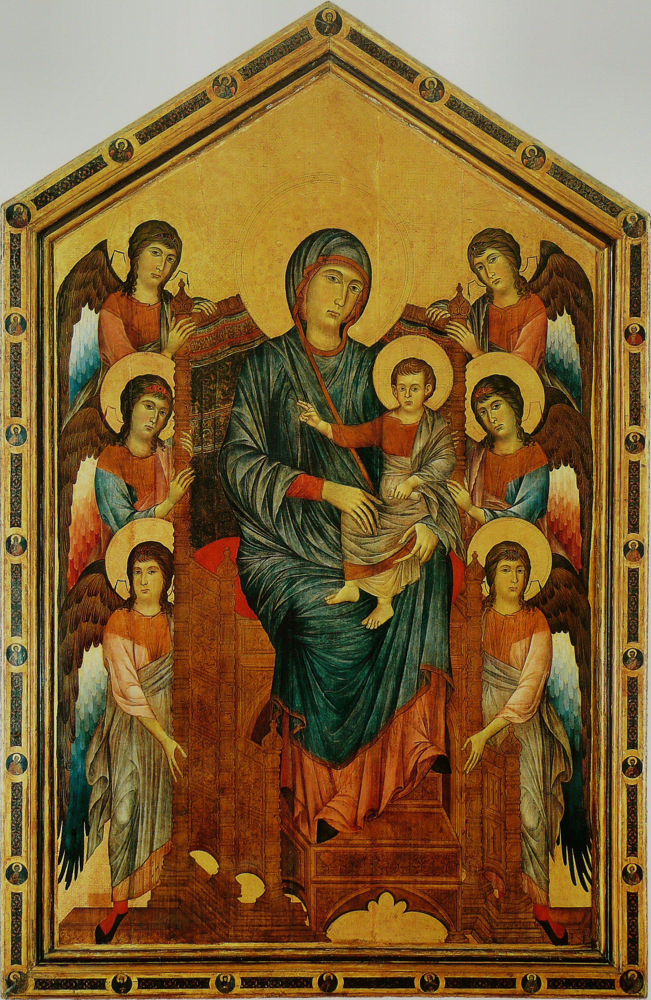

In [ ]:
display(raw_image)

In [ ]:
# Define the device to use (CPU or GPU)
device = torch.device('cuda:0')

In [ ]:
# Load the BLIP model for image captioning
model, vis_processors, _ = load_model_and_preprocess(
    name="blip_caption", model_type="large_coco", is_eval=True, device=device
)
# Uncomment the following line to use the base model instead of the large model
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip_caption", model_type="base_coco", is_eval=True, device=device
# )
# Get the keys of the visual processors used by the model
vis_processors.keys()

  0%|          | 0.00/1.66G [00:00<?, ?B/s]

dict_keys(['train', 'eval'])

In [ ]:
# Preprocess the image for the model and convert it to a tensor on the selected device
image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)

In [ ]:
# Generate a caption for the image using the model
caption = model.generate({"image": image})

Let's see what caption the model generated for the image above.

In [ ]:
caption = caption[0]
print(caption)

a painting of a woman holding a baby


### Example 2: Attention Maps

An attention map visualizes which parts of an image the model is focusing on when generating a word in a caption.
It highlights the regions of the image that are most relevant to the current word, providing insight into how the model is making its predictions.
Let's generate some attention maps for the image and caption above.

In [ ]:
# Load the BLiP model for image-text matching
model, vis_processors, text_processors = load_model_and_preprocess("blip_image_text_matching", "large", device=device, is_eval=True)

  0%|          | 0.00/3.43G [00:00<?, ?B/s]

In [42]:
# Set the width of the output image
dst_w = 720
# Get the original width and height of the image
w, h = raw_image.size
# Compute the scaling factor to resize the image
scaling_factor = dst_w / w
# Resize the image to the desired width while maintaining aspect ratio
resized_img = raw_image.resize((int(w * scaling_factor), int(h * scaling_factor)))
# Normalize the resized image and convert it to an array
norm_img = np.float32(resized_img) / 255

In [43]:
# Preprocess the image and caption for the image-text matching model
img = vis_processors["eval"](raw_image).unsqueeze(0).to(device)
txt = text_processors["eval"](caption)

In [44]:
# Tokenize the caption
txt_tokens = model.tokenizer(txt, return_tensors="pt").to(device)
# Compute the attention maps using Grad-CAM
gradcam, _ = compute_gradcam(model, img, txt, txt_tokens, block_num=7)

Let's generate the average attention map and save it.

In [ ]:
avg_gradcam = getAttMap(norm_img, gradcam[0][1], blur=True)

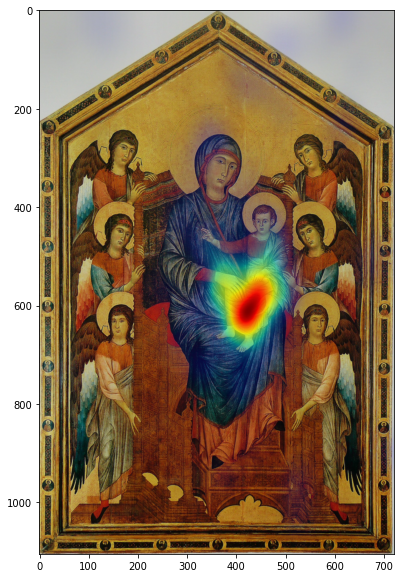

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(avg_gradcam)
plt.savefig(f'/average_{img_name}')

Let's generate the attention maps for each word in the caption to understand which regions of the image are relevant for which word.

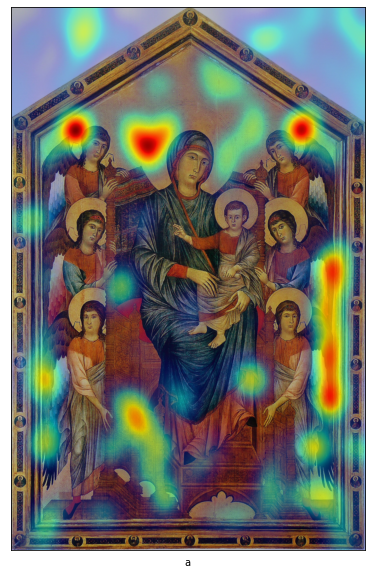

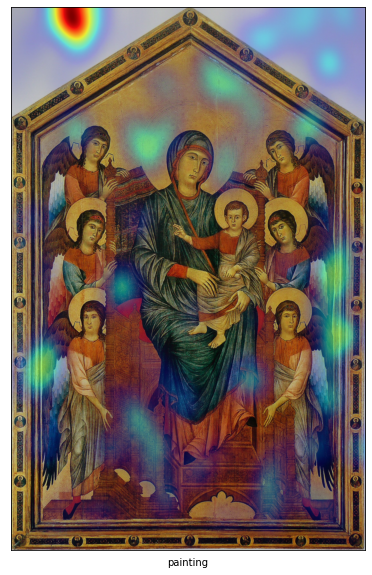

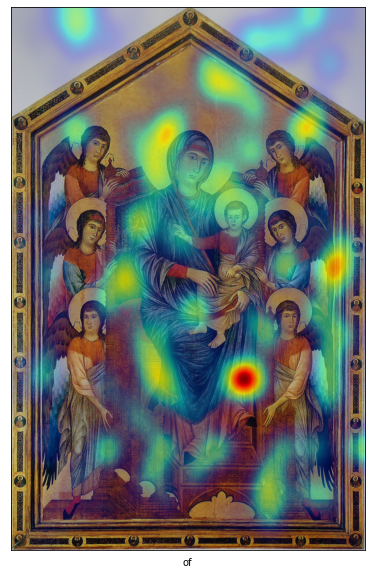

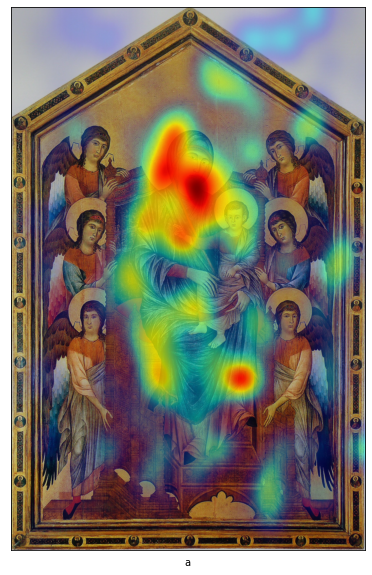

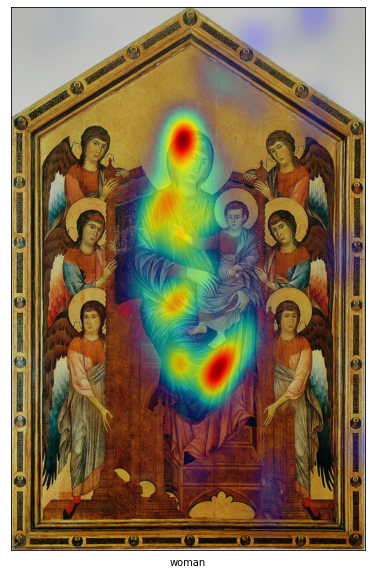

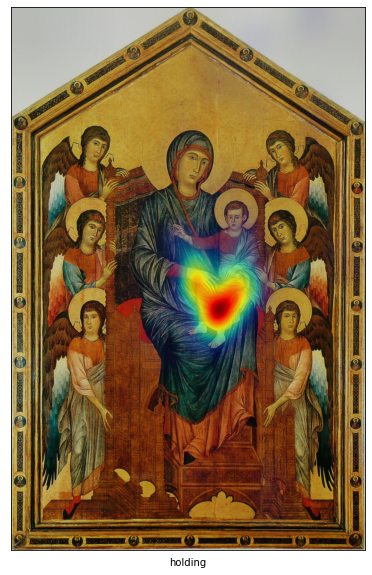

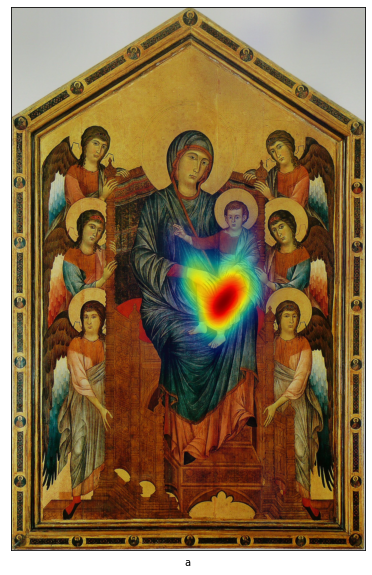

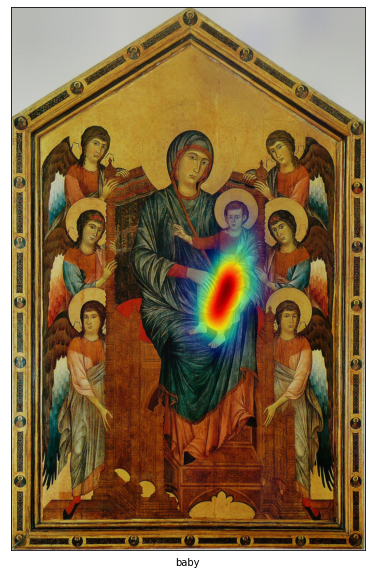

In [45]:
gradcam_iter = iter(gradcam[0][2:-1])
token_id_iter = iter(txt_tokens.input_ids[0][1:-1])

counter = 0
for i, (gradcam, token_id) in enumerate(zip(gradcam_iter, token_id_iter)):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    word = model.tokenizer.decode([token_id])
    gradcam_image = getAttMap(norm_img, gradcam, blur=True)
    ax.imshow(gradcam_image)
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_xlabel(word)
    plt.savefig(f'{counter}_{img_name}')
    counter += 1

##### Credit
* https://github.com/salesforce/LAVIS/blob/main/examples/blip_image_captioning.ipynb